## Import

In [3]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=80)
%matplotlib inline

In [4]:
import os 
os.chdir('/Users/gracenbourbeau/Downloads/luad_tcga_pan_can_atlas_2018/')
%pwd

'/Users/gracenbourbeau/Downloads/luad_tcga_pan_can_atlas_2018'

In [5]:
raw_rna_data = pd.read_table("data_mrna_seq_v2_rsem.txt", sep="\t")
raw_rna_data.head()

,Hugo_Symbol,Entrez_Gene_Id,TCGA-05-4244-01,TCGA-05-4249-01,TCGA-05-4250-01,TCGA-05-4382-01,TCGA-05-4384-01,TCGA-05-4389-01,TCGA-05-4390-01,TCGA-05-4395-01,...,TCGA-NJ-A4YG-01,TCGA-NJ-A4YI-01,TCGA-NJ-A4YP-01,TCGA-NJ-A4YQ-01,TCGA-NJ-A55A-01,TCGA-NJ-A55O-01,TCGA-NJ-A55R-01,TCGA-NJ-A7XG-01,TCGA-O1-A52J-01,TCGA-S2-AA1A-01
0,NaN,100130426,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,NaN,100133144,10.0113,7.1957,7.2453,11.3311,3.2254,4.0000,7.1084,3.4360,...,11.7148,3.6657,2.3298,16.3214,20.3514,15.5193,8.4195,42.9857,14.0861,20.5338
2,UBE2Q2P2,100134869,11.2820,12.4436,6.0184,7.5740,3.4942,13.7852,7.5810,12.1335,...,11.9573,9.7617,8.3410,7.5330,17.2393,22.9872,10.3226,81.1128,24.1914,8.9500
3,HMGB1P1,10357,49.5994,90.5117,49.5366,82.8303,72.5351,66.3658,109.1810,57.0596,...,163.5740,130.7490,101.7400,82.4231,100.4200,100.1870,74.7210,85.3715,61.1388,76.9265
4,NaN,10431,848.9400,924.0160,1140.6800,807.1730,562.0040,1342.6200,1148.3300,955.9140,...,919.1690,403.4910,918.9530,995.6060,536.7600,873.9790,766.7450,677.7330,1137.3200,565.4330


## Count of genes & sample in mRNA Sequence Data

In [6]:
rna_clean = raw_rna_data.set_index("Entrez_Gene_Id").drop("Hugo_Symbol",axis=1).transpose()
print(f"There are {len(rna_clean)} samples in total & there are {len(rna_clean.columns)} genes in total.")
rna_clean.head()

There are 510 samples in total & there are 20531 genes in total.


Entrez_Gene_Id,100130426,100133144,100134869,10357,10431,136542,155060,26823,280660,317712,...,55055,11130,7789,158586,79364,440590,79699,7791,23140,26009
TCGA-05-4244-01,0.0,10.0113,11.2820,49.5994,848.940,0.0,345.2310,1.0472,0.0000,0.0,...,221.164,517.672,39.7940,292.521,959.246,0.6981,1088.050,2837.94,871.28,575.268
TCGA-05-4249-01,0.0,7.1957,12.4436,90.5117,924.016,0.0,145.2020,1.6098,0.0000,0.0,...,198.589,287.507,62.1376,493.560,1179.330,20.2833,787.506,2351.25,1138.12,690.275
TCGA-05-4250-01,0.0,7.2453,6.0184,49.5366,1140.680,0.0,51.7284,0.0000,0.0000,0.0,...,520.899,1046.840,60.0182,365.415,843.903,26.5274,475.172,5437.45,1170.52,532.869
TCGA-05-4382-01,0.0,11.3311,7.5740,82.8303,807.173,0.0,240.0220,0.4786,0.2393,0.0,...,429.630,753.090,40.4424,346.752,946.687,64.8514,908.159,6770.15,1169.24,663.830
TCGA-05-4384-01,0.0,3.2254,3.4942,72.5351,562.004,0.0,274.2820,0.6109,0.0000,0.0,...,258.302,153.940,80.0244,563.225,1320.710,7.9414,778.864,3341.48,1737.32,723.274


## Cleaning df from duplicative values, NA values

In [7]:
rna_clean.isnull().values.any() #any NA vals?

# columns with all the same value
unique_counts = rna_clean.nunique()
same_value_cols = unique_counts[unique_counts == 1].index.tolist()
print(f"There are {len(same_value_cols)} columns with the same value.")
print(f"{same_value_cols[0:10]}...")

There are 340 columns with the same value.
[317712, 404770, 728045, 100131137, 143501, 9085, 253175, 286828, 653282, 267012]...


In [8]:
#need to drop the 340 columns with same vals
df_clean = rna_clean.drop(same_value_cols, axis = 1)
df_clean.head()

Entrez_Gene_Id,100130426,100133144,100134869,10357,10431,136542,155060,26823,280660,340602,...,55055,11130,7789,158586,79364,440590,79699,7791,23140,26009
TCGA-05-4244-01,0.0,10.0113,11.2820,49.5994,848.940,0.0,345.2310,1.0472,0.0000,0.0000,...,221.164,517.672,39.7940,292.521,959.246,0.6981,1088.050,2837.94,871.28,575.268
TCGA-05-4249-01,0.0,7.1957,12.4436,90.5117,924.016,0.0,145.2020,1.6098,0.0000,0.0000,...,198.589,287.507,62.1376,493.560,1179.330,20.2833,787.506,2351.25,1138.12,690.275
TCGA-05-4250-01,0.0,7.2453,6.0184,49.5366,1140.680,0.0,51.7284,0.0000,0.0000,0.0000,...,520.899,1046.840,60.0182,365.415,843.903,26.5274,475.172,5437.45,1170.52,532.869
TCGA-05-4382-01,0.0,11.3311,7.5740,82.8303,807.173,0.0,240.0220,0.4786,0.2393,7.6577,...,429.630,753.090,40.4424,346.752,946.687,64.8514,908.159,6770.15,1169.24,663.830
TCGA-05-4384-01,0.0,3.2254,3.4942,72.5351,562.004,0.0,274.2820,0.6109,0.0000,0.0000,...,258.302,153.940,80.0244,563.225,1320.710,7.9414,778.864,3341.48,1737.32,723.274


In [80]:
df_gene_subset = df_clean[[6439, 8755, 60, 2512, 729238, 972, 1915, 71, 2335, 1277, 7178, 567, 96610, 2597, 7117, 3106, 1281, 2495, 10568, 1509]]

In [81]:
df_gene_subset

Entrez_Gene_Id,6439,8755,60,2512,729238,972,1915,71,2335,1277,7178,567,96610,2597,7117,3106,1281,2495,10568,1509
TCGA-05-4244-01,283433.000,8126.97,137304.0,72733.7,84761.000,75449.9,148317.0,55303.3,33586.50,51421.90,55566.8,53432.2,5384.74,72742.5,36011.2,42815.4,15765.40,57441.0,79625.80,45617.6
TCGA-05-4249-01,112463.000,84181.00,103525.0,41532.1,81744.500,82297.3,159088.0,84527.8,31906.90,23076.60,82022.0,33858.6,36965.80,22877.6,63160.5,21915.0,24521.20,24406.6,102699.00,38765.2
TCGA-05-4250-01,31106.400,17526.00,168009.0,52019.6,41108.800,65692.1,86316.5,175592.0,73138.40,66134.80,61547.9,102413.0,14595.00,51756.9,61290.9,82767.1,62341.00,29381.4,11922.10,22480.6
TCGA-05-4382-01,203.887,209767.00,185012.0,158627.0,151.719,98069.2,66471.5,74542.0,179088.00,62325.60,68556.6,75471.5,166767.00,58762.1,70890.3,50619.9,72728.80,43955.6,11971.20,57222.4
TCGA-05-4384-01,415841.000,25029.00,85774.0,93593.2,115161.000,48861.3,75301.2,37571.2,54245.00,9033.60,57648.1,35850.9,9080.13,37808.2,25569.9,15716.3,8866.22,48941.3,80673.20,69462.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TCGA-NJ-A55O-01,280745.000,35040.80,78692.5,109002.0,455237.000,57400.8,89722.3,64720.5,15728.70,6760.21,83979.6,46451.6,9640.85,55756.7,38344.2,34028.5,6666.86,23819.1,37519.30,82889.1
TCGA-NJ-A55R-01,233308.000,149328.00,51586.7,125099.0,3680.660,24250.9,33416.5,50597.7,40582.70,55462.00,23908.2,32617.8,47165.80,65298.0,10258.2,41673.0,39359.60,57446.7,2229.11,65499.4
TCGA-NJ-A7XG-01,983539.000,8143.24,83239.8,21495.6,630121.000,115859.0,117601.0,75247.6,5795.08,8146.99,63769.7,29288.2,3508.90,38897.8,37017.5,16543.0,2360.62,22766.3,145691.00,52784.9
TCGA-O1-A52J-01,715604.000,10142.20,165550.0,71882.8,60855.500,241250.0,33799.0,62728.2,16795.70,53362.70,30664.6,53838.8,2630.55,20584.7,62390.9,126196.0,8494.26,24838.8,79972.20,122967.0


## Clustering mRNA data

In [9]:
import umap
import seaborn as sns

In [10]:
df_clean.index

Index(['TCGA-05-4244-01', 'TCGA-05-4249-01', 'TCGA-05-4250-01',
       'TCGA-05-4382-01', 'TCGA-05-4384-01', 'TCGA-05-4389-01',
       'TCGA-05-4390-01', 'TCGA-05-4395-01', 'TCGA-05-4396-01',
       'TCGA-05-4397-01',
       ...
       'TCGA-NJ-A4YG-01', 'TCGA-NJ-A4YI-01', 'TCGA-NJ-A4YP-01',
       'TCGA-NJ-A4YQ-01', 'TCGA-NJ-A55A-01', 'TCGA-NJ-A55O-01',
       'TCGA-NJ-A55R-01', 'TCGA-NJ-A7XG-01', 'TCGA-O1-A52J-01',
       'TCGA-S2-AA1A-01'],
      dtype='object', length=510)

In [11]:
data_gene = sc.AnnData(df_clean)

In [12]:
data_gene.var_names

Index(['100130426', '100133144', '100134869', '10357', '10431', '136542',
       '155060', '26823', '280660', '340602',
       ...
       '55055', '11130', '7789', '158586', '79364', '440590', '79699', '7791',
       '23140', '26009'],
      dtype='object', name='Entrez_Gene_Id', length=20191)

In [13]:
data_gene.obs.columns

Index([], dtype='object')

normalizing counts per cell
    finished (0:00:00)


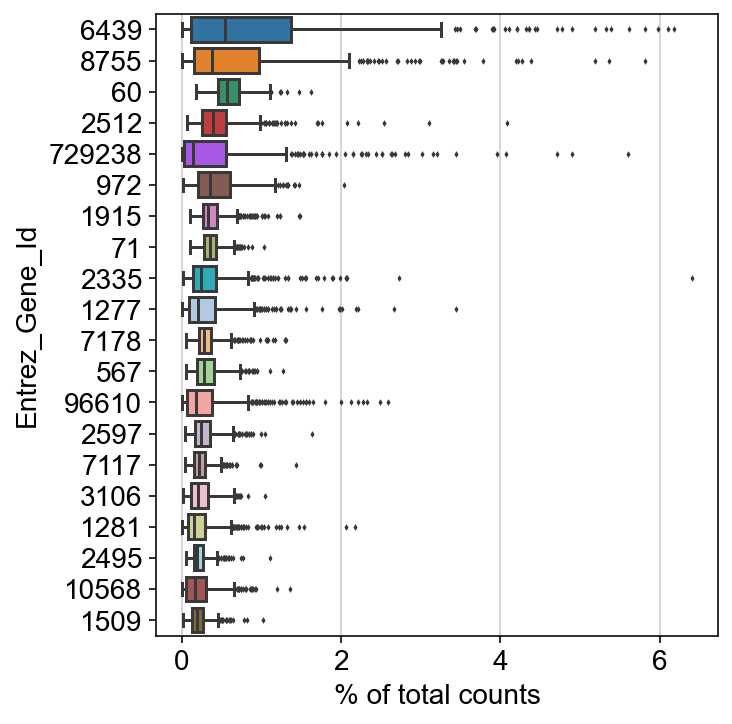

In [14]:
sc.pl.highest_expr_genes(data_gene, n_top=20, )
#Show those genes that yield the highest fraction of counts in each single cell, across all cells.

In [ ]:
#6439, 8755, 60, 2512, 729238, 972, 1915, 71, 2335, 1277, 7178, 567, 96610, 2597, 7117, 3106, 1281, 2495, 10568, 1509

### Summary of highest count genes (n=5) (source: www.ncbi.nlm.nih.gov/gene/)

#### 8755: Predicted to be located in external side of plasma membrane and sperm head plasma membrane. Predicted to be part of protein-containing complex. ** interesting as this is associated with testicular issues

## Clustering

computing PCA
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)
running Leiden clustering
    finished: found 9 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


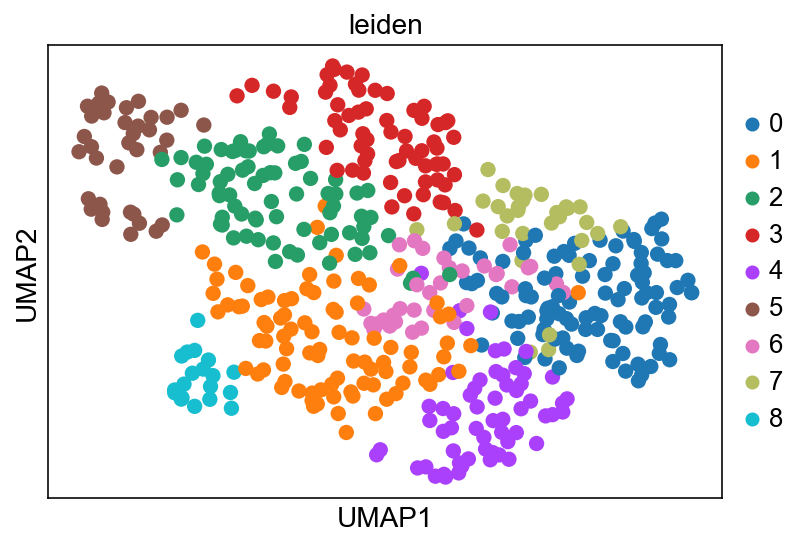

In [15]:
sc.tl.pca(data_gene, n_comps=50)
sc.pp.neighbors(data_gene)
sc.tl.umap(data_gene)
sc.tl.leiden(data_gene)
sc.pl.umap(data_gene, color='leiden')

In [16]:
pd.DataFrame(data_gene.obs['leiden'])

,leiden
TCGA-05-4244-01,2
TCGA-05-4249-01,0
TCGA-05-4250-01,0
TCGA-05-4382-01,1
TCGA-05-4384-01,2
...,...
TCGA-NJ-A55O-01,3
TCGA-NJ-A55R-01,2
TCGA-NJ-A7XG-01,3
TCGA-O1-A52J-01,5


In [17]:
print("Explained variance of PCA:" , data_gene.uns['pca']['variance_ratio'].sum())

Explained variance of PCA: 0.9262285


In [18]:
clusters_df = pd.DataFrame(data_gene.obs['leiden']).reset_index(level=0)
clusters_df['index'] = clusters_df['index'].str[:-3]

In [19]:
df_PC = pd.DataFrame(data_gene.obsm['X_pca'])
df_PC['index'] = clusters_df['index']
df_PC  = df_PC.add_prefix('PC_')
df_PC.head()

,PC_0,PC_1,PC_2,PC_3,PC_4,PC_5,PC_6,PC_7,PC_8,PC_9,...,PC_41,PC_42,PC_43,PC_44,PC_45,PC_46,PC_47,PC_48,PC_49,PC_index
0,102478.882812,-152156.312500,-10559.550781,-38726.367188,-48718.253906,-13733.694336,30539.347656,-76738.734375,-8313.724609,-45783.574219,...,-34349.324219,-9527.491211,-13203.504883,14588.382812,12240.326172,30733.839844,15006.308594,-18715.478516,17890.667969,TCGA-05-4244
1,-58162.105469,-87774.453125,19177.376953,27506.160156,-26514.996094,-64074.328125,22169.675781,-70108.101562,-11250.588867,-2268.757812,...,3739.857422,5828.090820,3543.179688,-31270.707031,12693.983398,6717.359375,5949.434082,-26598.332031,-19153.964844,TCGA-05-4249
2,-182412.140625,-155954.218750,-22627.677734,-7519.790527,-1507.230591,41557.203125,20310.099609,-67534.054688,-12544.358398,-39998.625000,...,-12758.887695,19335.726562,-55403.066406,-42271.148438,14237.364258,-32849.566406,13493.764648,35898.003906,-15939.460938,TCGA-05-4250
3,-248007.203125,86975.453125,-18582.691406,-33575.664062,991.179688,77546.062500,47810.238281,73085.710938,40519.632812,-44163.402344,...,-27027.138672,-7749.142090,-87.725510,8691.969727,14386.421875,-13188.133789,-11364.585938,11703.898438,-24958.476562,TCGA-05-4382
4,239119.265625,-121731.015625,-37848.253906,-54991.699219,-21650.513672,-94186.781250,-40588.175781,78811.984375,-3839.185303,-12096.173828,...,-4364.996582,20304.169922,8493.037109,-7146.453613,1347.923340,7465.342773,3135.352051,-16828.890625,-10948.703125,TCGA-05-4384


## Clinical data

In [20]:
data_patient = pd.read_table('data_clinical_patient.txt', sep='\t')
print(data_patient.iloc[0])
#****

#Identifier to uniquely specify a patient.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       #STRING
Subtype                                                                                                                                                                                                                                                                                                                                                                                        

In [21]:
data_patient = data_patient.drop([0,1,2,3], axis = 0)
df_patient = data_patient.reset_index(drop=True)
df_patient.head()

,#Identifier to uniquely specify a patient.,Subtype,Text field to hold cancer type acronym used by TCGA PanCanAtlas.,Legacy DMP patient identifier (DMPnnnn),Age at which a condition or disease was first diagnosed.,Sex,"The extent of a cancer, especially whether the disease has spread from the original site to other parts of the body based on AJCC staging criteria.","The version or edition of the American Joint Committee on Cancer Cancer Staging Handbooks, a publication by the group formed for the purpose of developing a system of clinical staging for cancer that is acceptable to the American medical profession and is compatible with other accepted classifications.","Time interval from the date of last followup to the date of initial pathologic diagnosis, represented as a calculated number of days..","Time interval from a person's date of birth to the date of initial pathologic diagnosis, represented as a calculated number of days.",...,Weight measured in kilograms.,Patient Part of PanCan Pathway Analysis,Overall patient survival status.,Overall survival in months since initial diagonosis.,The time period usually begins at the time of diagnosis or at the start of treatment and ends at the time of death.,The time period (months) usually begins at the time of diagnosis or at the start of treatment and ends at the time of death.,Disease free status since initial treatment.,Disease free (months) since initial treatment.,Progression Free Status,Progress Free Survival (Months)
0,TCGA-05-4249,LUAD,LUAD,4addf05f-3668-4b3f-a17f-c0227329ca52,67,Male,STAGE IB,6TH,1523,-24532,...,NaN,Yes,0:LIVING,50.07068416,0:ALIVE OR DEAD TUMOR FREE,50.07068416,NaN,NaN,0:CENSORED,50.07068416
1,TCGA-05-4250,LUAD,LUAD,f98ecd8a-b878-4f53-b911-20cd8e17281c,79,Female,STAGE IIIA,6TH,NaN,-29068,...,NaN,Yes,1:DECEASED,3.978038597,NaN,3.978038597,NaN,NaN,0:CENSORED,3.978038597
2,TCGA-05-4382,LUAD,LUAD,3434b91a-c05f-460f-a078-7b1bb6e7085d,68,Male,STAGE IB,6TH,607,-24868,...,NaN,Yes,0:LIVING,19.95594569,0:ALIVE OR DEAD TUMOR FREE,19.95594569,1:Recurred/Progressed,10.98070158,1:PROGRESSION,10.98070158
3,TCGA-05-4384,LUAD,LUAD,9a50e7e4-831d-489f-87d2-979e987561cc,66,Male,STAGE IIIA,6TH,426,-24411,...,NaN,Yes,0:LIVING,14.00532597,0:ALIVE OR DEAD TUMOR FREE,14.00532597,NaN,NaN,1:PROGRESSION,6.016372423
4,TCGA-05-4389,LUAD,LUAD,a3de401d-91fe-49a2-bb07-81c1a06506e6,70,Male,STAGE IA,5TH,1369,-25660,...,NaN,Yes,0:LIVING,45.00772594,0:ALIVE OR DEAD TUMOR FREE,45.00772594,NaN,NaN,0:CENSORED,45.00772594


In [22]:
df_patient.describe()

,#Identifier to uniquely specify a patient.,Subtype,Text field to hold cancer type acronym used by TCGA PanCanAtlas.,Legacy DMP patient identifier (DMPnnnn),Age at which a condition or disease was first diagnosed.,Sex,"The extent of a cancer, especially whether the disease has spread from the original site to other parts of the body based on AJCC staging criteria.","The version or edition of the American Joint Committee on Cancer Cancer Staging Handbooks, a publication by the group formed for the purpose of developing a system of clinical staging for cancer that is acceptable to the American medical profession and is compatible with other accepted classifications.","Time interval from the date of last followup to the date of initial pathologic diagnosis, represented as a calculated number of days..","Time interval from a person's date of birth to the date of initial pathologic diagnosis, represented as a calculated number of days.",...,Weight measured in kilograms.,Patient Part of PanCan Pathway Analysis,Overall patient survival status.,Overall survival in months since initial diagonosis.,The time period usually begins at the time of diagnosis or at the start of treatment and ends at the time of death.,The time period (months) usually begins at the time of diagnosis or at the start of treatment and ends at the time of death.,Disease free status since initial treatment.,Disease free (months) since initial treatment.,Progression Free Status,Progress Free Survival (Months)
count,565,501,565,513,494,513,511,492,391,482,...,0,565,513,504,477,504,304,301,513,504
unique,565,1,1,513,52,2,9,5,331,473,...,0,2,2,432,2,432,2,270,2,422
top,TCGA-05-4249,LUAD,LUAD,4addf05f-3668-4b3f-a17f-c0227329ca52,70,Female,STAGE IB,7TH,791,-30689,...,NaN,Yes,0:LIVING,26.00519446,0:ALIVE OR DEAD TUMOR FREE,26.00519446,0:DiseaseFree,16.9313213,0:CENSORED,16.9313213
freq,1,501,565,1,25,275,139,269,4,2,...,NaN,501,327,4,363,4,215,3,305,4


### Merging clinical & cluster data

In [23]:
df_patient_clusters = pd.merge(left=df_patient, right=clusters_df, left_on='#Identifier to uniquely specify a patient.', right_on="index")
df_patient_clusters.head()

,#Identifier to uniquely specify a patient.,Subtype,Text field to hold cancer type acronym used by TCGA PanCanAtlas.,Legacy DMP patient identifier (DMPnnnn),Age at which a condition or disease was first diagnosed.,Sex,"The extent of a cancer, especially whether the disease has spread from the original site to other parts of the body based on AJCC staging criteria.","The version or edition of the American Joint Committee on Cancer Cancer Staging Handbooks, a publication by the group formed for the purpose of developing a system of clinical staging for cancer that is acceptable to the American medical profession and is compatible with other accepted classifications.","Time interval from the date of last followup to the date of initial pathologic diagnosis, represented as a calculated number of days..","Time interval from a person's date of birth to the date of initial pathologic diagnosis, represented as a calculated number of days.",...,Overall patient survival status.,Overall survival in months since initial diagonosis.,The time period usually begins at the time of diagnosis or at the start of treatment and ends at the time of death.,The time period (months) usually begins at the time of diagnosis or at the start of treatment and ends at the time of death.,Disease free status since initial treatment.,Disease free (months) since initial treatment.,Progression Free Status,Progress Free Survival (Months),index,leiden
0,TCGA-05-4249,LUAD,LUAD,4addf05f-3668-4b3f-a17f-c0227329ca52,67,Male,STAGE IB,6TH,1523,-24532,...,0:LIVING,50.07068416,0:ALIVE OR DEAD TUMOR FREE,50.07068416,NaN,NaN,0:CENSORED,50.07068416,TCGA-05-4249,0
1,TCGA-05-4250,LUAD,LUAD,f98ecd8a-b878-4f53-b911-20cd8e17281c,79,Female,STAGE IIIA,6TH,NaN,-29068,...,1:DECEASED,3.978038597,NaN,3.978038597,NaN,NaN,0:CENSORED,3.978038597,TCGA-05-4250,0
2,TCGA-05-4382,LUAD,LUAD,3434b91a-c05f-460f-a078-7b1bb6e7085d,68,Male,STAGE IB,6TH,607,-24868,...,0:LIVING,19.95594569,0:ALIVE OR DEAD TUMOR FREE,19.95594569,1:Recurred/Progressed,10.98070158,1:PROGRESSION,10.98070158,TCGA-05-4382,1
3,TCGA-05-4384,LUAD,LUAD,9a50e7e4-831d-489f-87d2-979e987561cc,66,Male,STAGE IIIA,6TH,426,-24411,...,0:LIVING,14.00532597,0:ALIVE OR DEAD TUMOR FREE,14.00532597,NaN,NaN,1:PROGRESSION,6.016372423,TCGA-05-4384,2
4,TCGA-05-4389,LUAD,LUAD,a3de401d-91fe-49a2-bb07-81c1a06506e6,70,Male,STAGE IA,5TH,1369,-25660,...,0:LIVING,45.00772594,0:ALIVE OR DEAD TUMOR FREE,45.00772594,NaN,NaN,0:CENSORED,45.00772594,TCGA-05-4389,0


In [24]:
df_patient_clusters.columns

Index(['#Identifier to uniquely specify a patient.', 'Subtype',
       'Text field to hold cancer type acronym used by TCGA PanCanAtlas.',
       'Legacy DMP patient identifier (DMPnnnn)',
       'Age at which a condition or disease was first diagnosed.', 'Sex',
       'The extent of a cancer, especially whether the disease has spread from the original site to other parts of the body based on AJCC staging criteria.',
       'The version or edition of the American Joint Committee on Cancer Cancer Staging Handbooks, a publication by the group formed for the purpose of developing a system of clinical staging for cancer that is acceptable to the American medical profession and is compatible with other accepted classifications.',
       'Time interval from the date of last followup to the date of initial pathologic diagnosis, represented as a calculated number of days..',
       'Time interval from a person's date of birth to the date of initial pathologic diagnosis, represented as a calcul

### Dropping cols not needed

In [25]:
droper = ['Subtype','Text field to hold cancer type acronym used by TCGA PanCanAtlas.',
       'Legacy DMP patient identifier (DMPnnnn)',
       'The extent of a cancer, especially whether the disease has spread from the original site to other parts of the body based on AJCC staging criteria.',
       'The version or edition of the American Joint Committee on Cancer Cancer Staging Handbooks, a publication by the group formed for the purpose of developing a system of clinical staging for cancer that is acceptable to the American medical profession and is compatible with other accepted classifications.',
       'Time interval from the date of last followup to the date of initial pathologic diagnosis, represented as a calculated number of days..',
       "Time interval from a person's date of birth to the date of initial pathologic diagnosis, represented as a calculated number of days.",
       'Time interval from the last day on which a person is known to be alive to the date of initial pathologic diagnosis, represented as a calculated number of days.',
       'Form completion date',
       "Text term to describe the patient's history of neoadjuvant treatment and the kind of treatment given prior to resection of the tumor.",
       '10th revision of the International Statistical Classification of Diseases and Related Health Problems.',
       'The third edition of the International Classification of Diseases for Oncology, published in 2000, used principally in tumor and cancer registries for coding the site (topography) and the histology (morphology) of neoplasms._The study of the structure of the cells and their arrangement to constitute tissues and, finally, the association among these to form organs.  In pathology, the microscopic process of identifying normal and abnormal morphologic characteristics in tissues, by employing various cytochemical and immunocytochemical stains._A system of numbered categories for representation of data.',
       'The third edition of the International Classification of Diseases for Oncology, published in 2000, used principally in tumor and cancer registries for coding the site (topography) and the histology (morphology) of neoplasms._The description of an anatomical region or of a body part._Named locations of, or within, the body._A system of numbered categories for representation of data.',
       'Informed consent verified',
       'Yes/No/Unknown indicator to identify whether a patient has had a new tumor event after initial treatment.',
       'Code to represent the defined absence or presence of distant spread or metastases (M) to locations via vascular channels or lymphatics beyond the regional lymph nodes, using criteria established by the American Joint Committee on Cancer (AJCC).',
       "The codes that represent the stage of cancer based on the nodes present (N stage) according to criteria based on multiple editions of the AJCC's Cancer Staging Manual.",
       'Code of pathological T (primary tumor) to define the size or contiguous extension of the primary tumor (T), using staging criteria from the American Joint Committee on Cancer (AJCC).',
       'Primary lymph node presentation assessment.', 'Prior diagnosis.',
       'The time period usually begins at the time of diagnosis or at the start of treatment and ends at the time of death.',
       'The time period (months) usually begins at the time of diagnosis or at the start of treatment and ends at the time of death.',
       'Disease free status since initial treatment.','The text for reporting information about ethnicity.',
       'Disease free (months) since initial treatment.','index','The text for reporting information about race.',
         'Weight measured in kilograms.']



In [26]:
df_patient_clusters = df_patient_clusters.drop(droper, axis=1).reset_index(drop=True)
df_patient_clusters.head()

,#Identifier to uniquely specify a patient.,Age at which a condition or disease was first diagnosed.,Sex,Person neoplasm cancer status.,Radiation Therapy.,Patient Part of PanCan Pathway Analysis,Overall patient survival status.,Overall survival in months since initial diagonosis.,Progression Free Status,Progress Free Survival (Months),leiden
0,TCGA-05-4249,67,Male,Tumor Free,No,Yes,0:LIVING,50.07068416,0:CENSORED,50.07068416,0
1,TCGA-05-4250,79,Female,NaN,NaN,Yes,1:DECEASED,3.978038597,0:CENSORED,3.978038597,0
2,TCGA-05-4382,68,Male,Tumor Free,Yes,Yes,0:LIVING,19.95594569,1:PROGRESSION,10.98070158,1
3,TCGA-05-4384,66,Male,NaN,Yes,Yes,0:LIVING,14.00532597,1:PROGRESSION,6.016372423,2
4,TCGA-05-4389,70,Male,Tumor Free,No,Yes,0:LIVING,45.00772594,0:CENSORED,45.00772594,0


*** Imputation for clinical data - is it dist'b evenly across cols or is there one? (neoplasm NaN - has tumor; radiation for NaN no for tumor free, Nan yes for has tumor)

### Merging genes to clinical

In [27]:
#df_clean = df_clean.add_suffix('_gene')
#df_clean['ID'] = df_clean.index
#df_clean['ID'] = df_clean['ID'].str[:-3]

In [28]:
binary_columns = ['Overall patient survival status.', 'Progression Free Status']
for col in binary_columns:
    df_patient_clusters[col] = pd.to_numeric(df_patient_clusters[col].str[0])

In [29]:
df_patient_clusters['Radiation Therapy.'].unique()

array(['No', nan, 'Yes'], dtype=object)

In [30]:
interpret = True

In [31]:
if interpret == True:   
    df_patient_clusters['Person neoplasm cancer status.'] = df_patient_clusters['Person neoplasm cancer status.'].map({'With Tumor': 1, 'Tumor Free': 0})
    df_patient_clusters['Radiation Therapy.'] = df_patient_clusters['Radiation Therapy.'].map({'Yes': 1, 'No': 0})
    df_patient_clusters['Patient Part of PanCan Pathway Analysis'] = df_patient_clusters['Patient Part of PanCan Pathway Analysis'].map({'Yes': 1, 'No': 0})
    df_patient_clusters['Sex'] = df_patient_clusters['Sex'].map({'Male': 1, 'Female': 0})

In [32]:
df_patient_clusters.head()

,#Identifier to uniquely specify a patient.,Age at which a condition or disease was first diagnosed.,Sex,Person neoplasm cancer status.,Radiation Therapy.,Patient Part of PanCan Pathway Analysis,Overall patient survival status.,Overall survival in months since initial diagonosis.,Progression Free Status,Progress Free Survival (Months),leiden
0,TCGA-05-4249,67,1,0.0,0.0,1,0,50.07068416,0,50.07068416,0
1,TCGA-05-4250,79,0,NaN,NaN,1,1,3.978038597,0,3.978038597,0
2,TCGA-05-4382,68,1,0.0,1.0,1,0,19.95594569,1,10.98070158,1
3,TCGA-05-4384,66,1,NaN,1.0,1,0,14.00532597,1,6.016372423,2
4,TCGA-05-4389,70,1,0.0,0.0,1,0,45.00772594,0,45.00772594,0


In [33]:
df_patient_clusters_1= df_patient_clusters.loc[:, ~df_patient_clusters.columns.duplicated()].dropna(axis=0)

In [34]:
df_patient_clusters_1.head()

,#Identifier to uniquely specify a patient.,Age at which a condition or disease was first diagnosed.,Sex,Person neoplasm cancer status.,Radiation Therapy.,Patient Part of PanCan Pathway Analysis,Overall patient survival status.,Overall survival in months since initial diagonosis.,Progression Free Status,Progress Free Survival (Months),leiden
0,TCGA-05-4249,67,1,0.0,0.0,1,0,50.07068416,0,50.07068416,0
2,TCGA-05-4382,68,1,0.0,1.0,1,0,19.95594569,1,10.98070158,1
4,TCGA-05-4389,70,1,0.0,0.0,1,0,45.00772594,0,45.00772594,0
5,TCGA-05-4390,58,0,0.0,0.0,1,0,37.0187724,1,12.98615906,2
9,TCGA-05-4398,47,0,0.0,0.0,1,0,47.04605977,0,47.04605977,0


In [82]:
df_genes = df_gene_subset.add_prefix('gene_')
df_genes['ID'] = df_genes.index.str[:-3]
df_genes = df_genes.reset_index(drop=True)

In [83]:
df_survival = pd.merge(df_patient_clusters, df_genes, left_on='#Identifier to uniquely specify a patient.', right_on='ID').drop('ID', axis=1)
df_survival.head()

,#Identifier to uniquely specify a patient.,Age at which a condition or disease was first diagnosed.,Sex,Person neoplasm cancer status.,Radiation Therapy.,Patient Part of PanCan Pathway Analysis,Overall patient survival status.,Overall survival in months since initial diagonosis.,Progression Free Status,Progress Free Survival (Months),...,gene_7178,gene_567,gene_96610,gene_2597,gene_7117,gene_3106,gene_1281,gene_2495,gene_10568,gene_1509
0,TCGA-05-4249,67,1,0.0,0.0,1,0,50.07068416,0,50.07068416,...,82022.0,33858.6,36965.80,22877.6,63160.5,21915.0,24521.20,24406.6,102699.0,38765.2
1,TCGA-05-4250,79,0,NaN,NaN,1,1,3.978038597,0,3.978038597,...,61547.9,102413.0,14595.00,51756.9,61290.9,82767.1,62341.00,29381.4,11922.1,22480.6
2,TCGA-05-4382,68,1,0.0,1.0,1,0,19.95594569,1,10.98070158,...,68556.6,75471.5,166767.00,58762.1,70890.3,50619.9,72728.80,43955.6,11971.2,57222.4
3,TCGA-05-4384,66,1,NaN,1.0,1,0,14.00532597,1,6.016372423,...,57648.1,35850.9,9080.13,37808.2,25569.9,15716.3,8866.22,48941.3,80673.2,69462.4
4,TCGA-05-4389,70,1,0.0,0.0,1,0,45.00772594,0,45.00772594,...,59286.6,76921.1,15489.50,57290.6,34133.2,68799.3,9612.75,61073.5,23989.3,38732.2


In [84]:
df_survival= df_survival.loc[:, ~df_survival.columns.duplicated()].drop('#Identifier to uniquely specify a patient.', axis=1).dropna(axis=0)

In [85]:
df_survival.head()

,Age at which a condition or disease was first diagnosed.,Sex,Person neoplasm cancer status.,Radiation Therapy.,Patient Part of PanCan Pathway Analysis,Overall patient survival status.,Overall survival in months since initial diagonosis.,Progression Free Status,Progress Free Survival (Months),leiden,...,gene_7178,gene_567,gene_96610,gene_2597,gene_7117,gene_3106,gene_1281,gene_2495,gene_10568,gene_1509
0,67,1,0.0,0.0,1,0,50.07068416,0,50.07068416,0,...,82022.0,33858.6,36965.8,22877.6,63160.5,21915.0,24521.20,24406.6,102699.0,38765.2
2,68,1,0.0,1.0,1,0,19.95594569,1,10.98070158,1,...,68556.6,75471.5,166767.0,58762.1,70890.3,50619.9,72728.80,43955.6,11971.2,57222.4
4,70,1,0.0,0.0,1,0,45.00772594,0,45.00772594,0,...,59286.6,76921.1,15489.5,57290.6,34133.2,68799.3,9612.75,61073.5,23989.3,38732.2
5,58,0,0.0,0.0,1,0,37.0187724,1,12.98615906,2,...,88480.3,22476.8,72901.4,69778.1,59818.6,12886.9,52360.80,21617.1,23054.1,17331.6
9,47,0,0.0,0.0,1,0,47.04605977,0,47.04605977,0,...,39813.4,66628.3,92805.8,159736.0,38427.6,32838.5,35824.90,39744.2,32373.2,35770.3


*** check multidem for genes - perhaps choose genes

In [86]:
df_survival['Age at which a condition or disease was first diagnosed.'] = pd.to_numeric(df_survival['Age at which a condition or disease was first diagnosed.'])

In [87]:
df_survival['Overall survival in months since initial diagonosis.'] = pd.to_numeric(df_survival['Overall survival in months since initial diagonosis.'])

In [88]:
df_survival['Progress Free Survival (Months)'] = pd.to_numeric(df_survival['Progress Free Survival (Months)'])

In [89]:
df_survival.columns[df_survival.dtypes=='string']

Index([], dtype='object')

In [90]:
df_survival = df_survival.astype('int')

In [91]:
print (df_survival.dtypes)

Age at which a condition or disease was first diagnosed.    int64
Sex                                                         int64
Person neoplasm cancer status.                              int64
Radiation Therapy.                                          int64
Patient Part of PanCan Pathway Analysis                     int64
Overall patient survival status.                            int64
Overall survival in months since initial diagonosis.        int64
Progression Free Status                                     int64
Progress Free Survival (Months)                             int64
leiden                                                      int64
gene_6439                                                   int64
gene_8755                                                   int64
gene_60                                                     int64
gene_2512                                                   int64
gene_729238                                                 int64
gene_972  

## Survival analysis

In [41]:
#!pip install shap

In [92]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.pipeline import Pipeline, make_pipeline

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
import seaborn as sns
from sklearn.linear_model import LassoCV
import xgboost as xgb
from sksurv.linear_model import CoxPHSurvivalAnalysis, CoxnetSurvivalAnalysis
from sksurv.metrics import concordance_index_censored
from sksurv.ensemble import RandomSurvivalForest
from sksurv.ensemble import ComponentwiseGradientBoostingSurvivalAnalysis
from sksurv.ensemble import GradientBoostingSurvivalAnalysis
from sklearn.inspection import permutation_importance
import shap

In [93]:
var = ['Overall survival in months since initial diagonosis.']

y = df_survival[var]
y = y.apply(pd.to_numeric)
y = StandardScaler().fit_transform(y)
X = df_survival.drop(var, axis=1).reset_index(drop=True)
X = X.drop(['Progress Free Survival (Months)',
            'Overall patient survival status.', 'Progression Free Status'],
            axis=1).reset_index(drop=True) #covar too high to be predictors
X_train, X_test, y_train, y_test = train_test_split(
    X, y, random_state=42)

In [94]:
if interpret == True:
    categorical_features = ['Sex']
else:
    categorical_features = ['Sex','Person neoplasm cancer status.',
                            'Radiation Therapy.','Patient Part of PanCan Pathway Analysis', 
                            ]

numeric_features = X_train.drop(categorical_features, axis=1)
numeric_features = numeric_features.columns.tolist()
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

if interpret == True:
    preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ]
        )
    preprocess=preprocessor.fit(X_train.drop(categorical_features, axis=1).reset_index(drop=True)) 
else:

    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numeric_transformer, numeric_features),
            ('cat', categorical_transformer, categorical_features)
            ]
            )

    #Fit your preprocessor object
    preprocess=preprocessor.fit(X_train) 

In [95]:
X_train = preprocess.transform(X_train)
X_test = preprocess.transform(X_test)

In [96]:
X_train.shape

(276, 25)

In [181]:
#print(X_train)
#print(X_test)

## Modeling

### XGBoost

In [97]:
xgbr = xgb.XGBRegressor(n_estimators=10)
xgbr.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=10, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [98]:
print('train: ', xgbr.score(X_train, y_train))
print('test: ', xgbr.score(X_test, y_test))

train:  0.8390275046166105
test:  -0.05747661477486976


### Lasso

In [99]:
lasso = LassoCV(cv=2, random_state=0).fit(X_train, y_train)

In [100]:
print('train: ', lasso.score(X_train, y_train), '\ntest: ', lasso.score(X_test, y_test))

train:  0.09263231812913975 
test:  0.04161859877227103


## RF Classification Lime

In [56]:
#!pip install lime

In [151]:
df_survival.head()

,Age at which a condition or disease was first diagnosed.,Sex,Person neoplasm cancer status.,Radiation Therapy.,Patient Part of PanCan Pathway Analysis,Overall patient survival status.,Overall survival in months since initial diagonosis.,Progression Free Status,Progress Free Survival (Months),leiden,...,gene_7178,gene_567,gene_96610,gene_2597,gene_7117,gene_3106,gene_1281,gene_2495,gene_10568,gene_1509
0,67,1,0,0,1,0,50,0,50,0,...,82022,33858,36965,22877,63160,21915,24521,24406,102699,38765
2,68,1,0,1,1,0,19,1,10,1,...,68556,75471,166767,58762,70890,50619,72728,43955,11971,57222
4,70,1,0,0,1,0,45,0,45,0,...,59286,76921,15489,57290,34133,68799,9612,61073,23989,38732
5,58,0,0,0,1,0,37,1,12,2,...,88480,22476,72901,69778,59818,12886,52360,21617,23054,17331
9,47,0,0,0,1,0,47,0,47,0,...,39813,66628,92805,159736,38427,32838,35824,39744,32373,35770


In [152]:
import numpy as np
import pandas as pd

In [153]:
from sklearn.model_selection import train_test_split

X = df_survival.drop('Overall patient survival status.', axis=1)
y = df_survival['Overall patient survival status.']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

In [154]:
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)
score = model.score(X_test, y_test)

In [160]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)
  
# performing predictions on the test dataset
y_pred = clf.predict(X_test)

In [161]:
from sklearn import metrics  
print()
  
# using metrics module for accuracy calculation
print("ACCURACY OF THE MODEL: ", metrics.accuracy_score(y_test, y_pred))


ACCURACY OF THE MODEL:  0.8378378378378378


In [196]:
import pandas as pd
feature_imp = pd.Series(clf.feature_importances_, index = df_survival.keys()[[0,1,2,3,4,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29]]).sort_values(ascending = False)
feature_imp

Person neoplasm cancer status.                              0.143769
Progression Free Status                                     0.123366
Progress Free Survival (Months)                             0.047328
Overall survival in months since initial diagonosis.        0.047109
gene_2597                                                   0.040120
gene_7178                                                   0.039281
gene_60                                                     0.037762
gene_6439                                                   0.034573
gene_10568                                                  0.032417
gene_1915                                                   0.031700
gene_2335                                                   0.031078
gene_8755                                                   0.030414
gene_729238                                                 0.030197
gene_7117                                                   0.029927
gene_1277                         

In [200]:
import lime
from lime import lime_tabular

explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns,
    class_names=['1', '0'],
    mode='classification'
)

In [201]:
exp = explainer.explain_instance(
    data_row=X_test.iloc[1], 
    predict_fn=model.predict_proba
)

exp.show_in_notebook(show_table=True)

In [202]:
exp = explainer.explain_instance(
    data_row=X_test.iloc[5], 
    predict_fn=model.predict_proba
)

exp.show_in_notebook(show_table=True)

In [203]:
exp = explainer.explain_instance(
    data_row=X_test.iloc[10], 
    predict_fn=model.predict_proba
)

exp.show_in_notebook(show_table=True)

In [ ]:
# genes of interest: 6439, 8755, 60, 2512, 729238, 972, 1915, 71, 2335, 1277, 7178, 567, 96610, 2597, 7117, 3106, 1281, 2495, 10568, 1509

## RF Regression Lime

In [119]:
df_survival.isnull().sum()

Age at which a condition or disease was first diagnosed.    0
Sex                                                         0
Person neoplasm cancer status.                              0
Radiation Therapy.                                          0
Patient Part of PanCan Pathway Analysis                     0
Overall patient survival status.                            0
Overall survival in months since initial diagonosis.        0
Progression Free Status                                     0
Progress Free Survival (Months)                             0
leiden                                                      0
gene_6439                                                   0
gene_8755                                                   0
gene_60                                                     0
gene_2512                                                   0
gene_729238                                                 0
gene_972                                                    0
gene_191

In [132]:
X = df_survival[['Age at which a condition or disease was first diagnosed.','Sex','Person neoplasm cancer status.','Radiation Therapy.','Patient Part of PanCan Pathway Analysis','Overall survival in months since initial diagonosis.','Progression Free Status','Progress Free Survival (Months)','leiden','gene_6439','gene_8755','gene_60','gene_2512','gene_729238','gene_972','gene_1915','gene_71','gene_2335','gene_1277','gene_7178','gene_567','gene_96610','gene_2597','gene_7117','gene_3106','gene_1281','gene_2495','gene_10568','gene_1509']]
y = df_survival['Overall patient survival status.']

In [204]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)

In [205]:
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor(max_depth=6, random_state=0, n_estimators=10)
model.fit(X_train, y_train)

RandomForestRegressor(max_depth=6, n_estimators=10, random_state=0)

In [206]:
y_pred = model.predict(X_test)

In [207]:
mse=mean_squared_error(y_test,y_pred)
rmse=np.sqrt(mse)
rmse

0.4009621516094189

In [220]:
model.feature_importances_

array([0.02799609, 0.00513443, 0.16109903, 0.00540311, 0.00333999,
       0.02914938, 0.22779213, 0.09062377, 0.00562231, 0.05381584,
       0.00666749, 0.05443001, 0.01308802, 0.0253104 , 0.01653967,
       0.02795375, 0.00808286, 0.03104303, 0.02431086, 0.00751305,
       0.0077753 , 0.00872212, 0.03514811, 0.00615157, 0.01723363,
       0.0333158 , 0.01680366, 0.02037568, 0.0295589 ])

In [208]:
import lime
import lime.lime_tabular

In [209]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X_train.columns.values.tolist(),
                                                  class_names=['Overall patient survival status.'], verbose=True, mode='regression')

In [210]:
j = 5
exp = explainer.explain_instance(X_test.values[j], model.predict, num_features=6)

Intercept 0.5198943461750343
Prediction_local [0.29557916]
Right: 0.8


In [211]:
exp.show_in_notebook(show_table=True)

In [212]:
j = 10
exp = explainer.explain_instance(X_test.values[j], model.predict, num_features=6)

Intercept 0.13052073811924403
Prediction_local [0.67231892]
Right: 0.8931265664160402


In [213]:
exp.show_in_notebook(show_table=True)

In [214]:
j = 15
exp = explainer.explain_instance(X_test.values[j], model.predict, num_features=6)

Intercept 0.5646985939986356
Prediction_local [0.15629701]
Right: 0.3122991596601104


In [215]:
exp.show_in_notebook(show_table=True)

In [216]:
j = 20
exp = explainer.explain_instance(X_test.values[j], model.predict, num_features=6)

Intercept 0.6211302826739222
Prediction_local [0.05732439]
Right: 0.011072034010927418


In [217]:
exp.show_in_notebook(show_table=True)

In [146]:
j = 25
exp = explainer.explain_instance(X_test.values[j], model.predict, num_features=6)

Intercept 0.6029489838440611
Prediction_local [0.20457225]
Right: 0.2060613974223481


In [147]:
exp.show_in_notebook(show_table=True)